In [1]:
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter
import yfinance as yf
from alpha_vantage.timeseries import TimeSeries
from sklearn.model_selection import train_test_split
from lifelines import CoxPHFitter
from sklearn.tree import DecisionTreeClassifier
from lifelines import WeibullAFTFitter
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sksurv.ensemble import RandomSurvivalForest
from sksurv.ensemble import GradientBoostingSurvivalAnalysis

In [2]:
def categorize_reason(row):
    reason = row.lower()
    if 'market cap' in reason or 'market value' in reason or 'capitalization' in reason:
        return 'Market Cap'
    elif 'purchas' in reason or 'acqui' in reason or 'separat' in reason or \
         'merg' in reason or 'bought' in reason or 'taken' in reason:
        return 'M&A'
    elif 'spun' in reason or 'spin' in reason:
        return 'Spin Off'
    elif 'bankruptcy' in reason:
        return 'Bankrupt'
    else:
        return 'Other'

In [3]:
df_ = pd.read_csv('additions_removals.csv')
all_members = pd.read_csv('all_additions.csv')
market_caps = pd.read_csv('market_caps.csv')
df_all = pd.read_csv('market_caps_all.csv')

In [4]:
market_caps

,PERMNO,date,TICKER,PRC,SHROUT
0,10147,2015-01-30,EMC,25.93,2034909.0
1,10147,2015-02-27,EMC,28.94,1988087.0
2,10147,2015-03-31,EMC,25.56,1976825.0
3,10147,2015-04-30,EMC,26.91,1942000.0
4,10147,2015-05-29,EMC,26.34,1942061.0
...,...,...,...,...,...
21126,93422,2020-11-30,QEP,1.61,242221.0
21127,93422,2020-12-31,QEP,2.39,242936.0
21128,93422,2021-01-29,QEP,2.85,242936.0
21129,93422,2021-02-26,QEP,3.44,242566.0


In [5]:
df_.rename(columns={'Unnamed: 5': 'Reason sentence'},inplace=True)
df_['Reason'] = df_['Reason sentence'].apply(categorize_reason)
df_.drop(['Reason sentence'], axis=1, inplace=True)

In [6]:
df_['Date']=pd.to_datetime(df_['Date'])
df_.rename(columns={'Date': 'Date Removed'},inplace=True)
df_.rename(columns={'Ticker Removed': 'Ticker'},inplace=True)

In [7]:
market_caps = market_caps[['date', 'SHROUT','TICKER','PRC']]
market_caps['Market Cap'] = market_caps['PRC'] * market_caps['SHROUT'] * 1000
market_caps.rename(columns={'date': 'Date','TICKER':'Ticker'},inplace=True)
market_caps['Date']=pd.to_datetime(market_caps['Date'])
market_caps 

,Date,SHROUT,Ticker,PRC,Market Cap
0,2015-01-30,2034909.0,EMC,25.93,5.276519e+10
1,2015-02-27,1988087.0,EMC,28.94,5.753524e+10
2,2015-03-31,1976825.0,EMC,25.56,5.052765e+10
3,2015-04-30,1942000.0,EMC,26.91,5.225922e+10
4,2015-05-29,1942061.0,EMC,26.34,5.115389e+10
...,...,...,...,...,...
21126,2020-11-30,242221.0,QEP,1.61,3.899758e+08
21127,2020-12-31,242936.0,QEP,2.39,5.806170e+08
21128,2021-01-29,242936.0,QEP,2.85,6.923676e+08
21129,2021-02-26,242566.0,QEP,3.44,8.344270e+08


In [8]:
deleted_info = pd.merge(df_[['Date Removed','Ticker','Reason']], market_caps, on='Ticker', how='inner')
deleted_info 

,Date Removed,Ticker,Reason,Date,SHROUT,PRC,Market Cap
0,2023-12-18,SEE,Market Cap,2015-01-30,211158.0,40.5000,8.551899e+09
1,2023-12-18,SEE,Market Cap,2015-02-27,210151.0,47.1300,9.904417e+09
2,2023-12-18,SEE,Market Cap,2015-03-31,210151.0,45.5600,9.574480e+09
3,2023-12-18,SEE,Market Cap,2015-04-30,211253.0,45.6000,9.633137e+09
4,2023-12-18,SEE,Market Cap,2015-05-29,210166.0,48.7000,1.023508e+10
...,...,...,...,...,...,...,...
19842,1997-06-17,USL,M&A,2023-08-31,1950.0,38.0909,7.427725e+07
19843,1997-06-17,USL,M&A,2023-09-29,1900.0,40.0968,7.618392e+07
19844,1997-06-17,USL,M&A,2023-10-31,2000.0,38.3672,7.673440e+07
19845,1997-06-17,USL,M&A,2023-11-30,2050.0,36.5700,7.496850e+07


In [9]:
deleted_info =deleted_info[deleted_info['Reason']=='Market Cap']

In [10]:
all_members['Date added']=pd.to_datetime(all_members['Date added'])
all_members.rename(columns={'Date added': 'Date Added'},inplace=True)
all_members.rename(columns={'Symbol': 'Ticker'},inplace=True)

In [11]:
df_all = df_all[['date', 'SHROUT','TICKER','PRC']]
df_all['Market Cap'] = df_all['PRC']*df_all['SHROUT']*1000
df_all.rename(columns={'date': 'Date','TICKER':'Ticker'},inplace=True)
df_all['Date']=pd.to_datetime(df_all['Date'])

In [12]:
members_info = pd.merge(all_members[['Date Added','Ticker']], df_all, on='Ticker', how='inner')

In [13]:
members_info

,Date Added,Ticker,Date,SHROUT,PRC,Market Cap
0,2023-12-18,BLDR,2015-01-30,98226.0,5.92,5.814979e+08
1,2023-12-18,BLDR,2015-02-27,98226.0,6.03,5.923028e+08
2,2023-12-18,BLDR,2015-03-31,98537.0,6.67,6.572418e+08
3,2023-12-18,BLDR,2015-04-30,99144.0,12.76,1.265077e+09
4,2023-12-18,BLDR,2015-05-29,99258.0,12.28,1.218888e+09
...,...,...,...,...,...,...
51691,2057-03-04,XEL,2023-08-31,551533.0,57.13,3.150908e+10
51692,2057-03-04,XEL,2023-09-29,551663.0,57.22,3.156616e+10
51693,2057-03-04,XEL,2023-10-31,551816.0,59.27,3.270613e+10
51694,2057-03-04,XEL,2023-11-30,551816.0,60.84,3.357249e+10


In [14]:
deleted_info

,Date Removed,Ticker,Reason,Date,SHROUT,PRC,Market Cap
0,2023-12-18,SEE,Market Cap,2015-01-30,211158.0,40.500,8.551899e+09
1,2023-12-18,SEE,Market Cap,2015-02-27,210151.0,47.130,9.904417e+09
2,2023-12-18,SEE,Market Cap,2015-03-31,210151.0,45.560,9.574480e+09
3,2023-12-18,SEE,Market Cap,2015-04-30,211253.0,45.600,9.633137e+09
4,2023-12-18,SEE,Market Cap,2015-05-29,210166.0,48.700,1.023508e+10
...,...,...,...,...,...,...,...
19706,2000-07-27,RAD,Market Cap,2023-06-30,56709.0,1.510,8.563059e+07
19707,2000-07-27,RAD,Market Cap,2023-07-31,56696.0,1.620,9.184752e+07
19708,2000-07-27,RAD,Market Cap,2023-08-31,56696.0,0.770,4.365592e+07
19709,2000-07-27,RAD,Market Cap,2023-09-29,56696.0,0.448,2.539981e+07


In [15]:
threshold_df = pd.DataFrame({
    'Date': ['2014-07-16', '2017-03-10','2020-12-07','2021-03-17','2022-03-04','2023-07-05','2024-01-02'],
    'Threshold': [5.3e9, 6.1e9,8.2e9,11.8e9,14.6e9,12.7e9,15.8e9]  # Example threshold values
})
members_info = members_info.sort_values(by='Date')
deleted_info = deleted_info.sort_values(by='Date')
threshold_df['Date'] = pd.to_datetime(threshold_df['Date'])
members_info = pd.merge_asof(members_info, threshold_df, on='Date', direction='backward')
deleted_info = pd.merge_asof(deleted_info, threshold_df, on='Date', direction='backward')

In [16]:
members_info = members_info.sort_values(['Ticker', 'Date'])
deleted_info = deleted_info.sort_values(['Ticker', 'Date'])
deleted_info['Date'] = pd.to_datetime(deleted_info['Date'])
members_info['Date'] = pd.to_datetime(members_info['Date'])
members_info['Year'] = members_info['Date'].dt.year
deleted_info['Year'] = deleted_info['Date'].dt.year
members_info['Above Threshold'] = members_info['Market Cap'] >= members_info['Threshold']
deleted_info['Above Threshold'] = deleted_info['Market Cap'] >= deleted_info['Threshold']
deleted_info['DateDiff'] = deleted_info.groupby('Ticker')['Date'].diff().dt.days
members_info['DateDiff'] = members_info.groupby('Ticker')['Date'].diff().dt.days
members_info['Prev Market Cap'] = members_info.groupby('Ticker')['Market Cap'].shift(1)
deleted_info['Prev Market Cap'] = deleted_info.groupby('Ticker')['Market Cap'].shift(1)
members_info['Prev Above Threshold'] = members_info.groupby('Ticker')['Above Threshold'].shift(1)
members_info['Monthly Pct Change'] = members_info.apply(
    lambda row: (
        (row['Market Cap'] - row['Prev Market Cap']) / row['Prev Market Cap']
           if 20 <= row['DateDiff'] <= 50 else np.nan
    ),
    axis=1)
deleted_info['Monthly Pct Change'] = deleted_info.apply(
    lambda row: (
        (row['Market Cap'] - row['Prev Market Cap']) / row['Prev Market Cap']
           if 20 <= row['DateDiff'] <= 50 else np.nan
    ),
    axis=1)
members_info = members_info[members_info['Date'] > members_info['Date Added']]
deleted_info = deleted_info[deleted_info['Date'] < deleted_info['Date Removed']]

In [2]:
members_info

NameError: name 'members_info' is not defined

In [ ]:
members_info['Deleted'] = 0
deleted_info['Deleted'] = 1

gics_ind = pd.read_csv('gics_ind_match.csv')
members_info = members_info.merge(gics_ind[['Ticker','Industry']], on='Ticker', how='left')
deleted_info = deleted_info.merge(gics_ind[['Ticker','Industry']], on='Ticker', how='left')

In [18]:
def map_year_to_regime(year):
    regimes = {
        2016: 'Moderately Good',
        2017: 'Good',
        2018: 'Moderately Good',
        2019: 'Moderately Bad',
        2020: 'Bad',
        2021: 'Moderately Bad',
        2022: 'Moderately Good',
        2023: 'Moderately Good'
    }
    return regimes.get(year, 'Unknown') 
def map_sic_to_ind(sic_code):
    sic_ranges_to_industry = {
        (1, 39): "Industrials",
        (73, 73): "Information Technology",
        (50, 59): "Consumer Discretionary",
        (60, 67): "Financials",
        (20, 21): "Consumer Staples",
        (80, 80): "Health Care",
        (25, 39): "Materials",
        (10, 14): "Energy",
        (49, 49): "Utilities",
        (65, 65): "Real Estate",
        (48, 48): "Communication Services",
    }
    for sic_range, industry in sic_ranges_to_industry.items():
        if sic_range[0] <= sic_code <= sic_range[1]:
            return industry
    

    return 'Unknown'

In [19]:
mock_data = pd.DataFrame({
    'Ticker': ['A', 'A', 'A', 'A', 'A','A','A','A','B', 'B', 'B','B','B','B','B'],
    'Above Threshold': [True, True, True, True, True, True, True, True, False,False,True,False, False, False,False],
    'Date': pd.to_datetime(['2020-01-01', '2020-02-01', '2020-03-01', '2020-04-01', 
                            '2020-05-01', '2020-06-01', '2020-07-01', '2020-08-01','2021-01-01', '2021-02-01', '2021-03-01',
                           '2021-04-01', '2021-05-01', '2021-06-01','2021-07-01']),
    'Deleted': [1, 1, 1, 1,1, 1, 1,1,1, 1, 1, 1,1, 1, 1],
    'Monthly Pct Change': [0.8, -0.03, 0.04, -0.01, 0.00, 0.05, -0.8,0.05, -0.03, 0.04, -0.01, 0.00, 0.05, -0.02,-0.5]
})


mock_data2 = pd.DataFrame({
    'Ticker': ['C', 'C', 'C', 'C', 'C','C','C','C','D', 'D', 'D','D','D','D','D'],
    'Above Threshold': [True, True, True, False, False, False, False, True, False,True,True,False, False, False,False],
    'Date': pd.to_datetime(['2020-01-01', '2020-02-01', '2020-03-01', '2020-04-01', 
                            '2020-05-01', '2020-06-01', '2020-07-01', '2020-08-01','2021-01-01', '2021-02-01', '2021-03-01',
                           '2021-04-01', '2021-05-01', '2021-06-01','2021-07-01']),
    'Deleted': [0, 0, 0,0, 0, 0,0, 0,0, 0, 0,0, 0, 0,0],
    'Monthly Pct Change': [0.8, -0.03, 0.04, -0.01, 0.00, 0.05, -0.8,0.05, -0.03, 0.04, -0.01, 0.00, 0.05, -0.02,-0.5]
})

mock_data_combined = pd.concat([mock_data,mock_data2])

def calculate_metrics_adjusted(df, X):
    df = df.sort_values(by=['Ticker', 'Date']).reset_index(drop=True)
    df['Stretch Start'] = (~df['Above Threshold']) & (df.groupby('Ticker')['Above Threshold'].shift(1, fill_value=True))
    df['Stretch ID'] = df.groupby('Ticker')['Stretch Start'].cumsum()
    df['Deleted'] = df.groupby('Ticker')['Deleted'].transform('max')
    
    if len(df[df['Above Threshold'] == False])==0:
        return
    
    metrics = df[df['Above Threshold'] == False].groupby(['Ticker', 'Stretch ID']).apply(lambda group: pd.Series({
    'Min_Monthly_Pct_Change': group.head(X)['Monthly Pct Change'].min(),
    'Avg_Monthly_Pct_Change': group.head(X)['Monthly Pct Change'].mean(),
    'Stretch Length': len(group),
    'Year': group['Date'].iloc[-1].year,
    'Industry': group['Industry'].iloc[0]
    }))
    
    metrics.index.names = ['Ticker_index', 'Stretch_ID_index']

    metrics_reset = metrics.reset_index()
    
    metrics_reset.rename(columns={'Ticker_index': 'Ticker', 'Stretch_ID_index': 'Stretch ID'}, inplace=True)
    
    last_stretch = df[df['Deleted'] == 1].groupby('Ticker')['Stretch ID'].last()

    metrics_reset['Last Stretch Length'] = None  # Initialize column to avoid insertion issues
    for idx, row in metrics_reset.iterrows():
        if row['Ticker'] in last_stretch and row['Stretch ID'] == last_stretch[row['Ticker']]:
            metrics_reset.at[idx, 'Last Stretch Length'] = row['Stretch Length']

    metrics_reset['Deleted'] = metrics_reset['Ticker'].map(df.groupby('Ticker')['Deleted'].max())

    return metrics_reset

In [1]:
df_stats=calculate_metrics_adjusted(deleted_info, 40)
df_stats =df_stats[~pd.isna(df_stats['Last Stretch Length'])]
sorted_df = df_stats.sort_values(by='Last Stretch Length')

NameError: name 'calculate_metrics_adjusted' is not defined

In [27]:
max_value = df_stats['Last Stretch Length'].max()
percentile_75 = np.percentile(df_stats['Last Stretch Length'].dropna(), 75)
percentile_95 = np.percentile(df_stats['Last Stretch Length'].dropna(), 95)
mean_value = df_stats['Last Stretch Length'].mean()
median_value = df_stats['Last Stretch Length'].median()

print(f"Maximum: {max_value}")
print(f"75th Percentile: {percentile_75}")
print(f"95th Percentile: {percentile_95}")
print(f"Mean: {mean_value}")
print(f"Median: {median_value}")

Maximum: 65.0
75th Percentile: 22.0
95th Percentile: 37.849999999999994
Mean: 15.921875
Median: 12.0


In [28]:
Q1 = df_stats['Last Stretch Length'].quantile(0.25)
Q3 = df_stats['Last Stretch Length'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 -  IQR
upper_bound = Q3 + IQR

outliers = df_stats[(df_stats['Last Stretch Length'] < lower_bound) | (df_stats['Last Stretch Length'] > upper_bound)]
print("Outliers:\n", outliers['Last Stretch Length'].tolist())

df_no_outliers = df_stats[(df_stats['Last Stretch Length'] >= lower_bound) & (df_stats['Last Stretch Length'] <= upper_bound)]


max_value = df_no_outliers['Last Stretch Length'].max()
percentile_75 = np.percentile(df_no_outliers['Last Stretch Length'].dropna(), 75)
percentile_95 = np.percentile(df_no_outliers['Last Stretch Length'].dropna(), 95)
mean_value = df_no_outliers['Last Stretch Length'].mean()
median_value = df_no_outliers['Last Stretch Length'].median()

print(f"Maximum: {max_value}")
print(f"75th Percentile: {percentile_75}")
print(f"95th Percentile: {percentile_95}")
print(f"Mean: {mean_value}")
print(f"Median: {median_value}") 

Outliers:
 [43.0, 65.0, 65.0]
Maximum: 38.0
75th Percentile: 19.0
95th Percentile: 36.0
Mean: 13.868852459016393
Median: 12.0


,Date Added,Ticker,Date,SHROUT,PRC,Market Cap,Threshold,Year,Above Threshold,DateDiff,Prev Market Cap,Prev Above Threshold,Monthly Pct Change,Deleted,Industry
0,2000-06-05,A,2015-01-30,335902.0,37.77,1.268702e+10,5.300000e+09,2015,True,NaN,NaN,NaN,NaN,0,Health Care


In [31]:
# THIS IS FINAL VERSION OF DELETIONS MODEL
def calibration_deletion_rfsog(deleted_info, members_info, num_months, threshold_months, prob_threshold,regime=None):
    # Mark entries as deleted or not
    members_info['Deleted'] = 0
    deleted_info['Deleted'] = 1
    members_info = members_info[['Ticker','Date', 'Year','Market Cap', 'Above Threshold', 'Monthly Pct Change', 'Deleted','Industry']]
    deleted_info = deleted_info[['Ticker','Date', 'Year','Market Cap', 'Above Threshold', 'Monthly Pct Change', 'Deleted','Industry']]

deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
    members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
    combined_df = pd.concat([deleted_info, members_info], ignore_index=True)
    
    
    
    combined_df_adjusted = combined_df.groupby('Ticker').apply(lambda group: calculate_metrics_adjusted(group, num_months)).reset_index(drop=True)
    combined_df_adjusted['Regime'] = combined_df_adjusted['Year'].apply(map_year_to_regime)
    combined_df_adjusted.loc[combined_df_adjusted['Deleted']==1,'Stretch Length'] =combined_df_adjusted[combined_df_adjusted['Deleted']==1]['Last Stretch Length']
    combined_df_adjusted = combined_df_adjusted.loc[~pd.isna(combined_df_adjusted['Stretch Length'])]
    
    combined_df_adjusted.fillna(0, inplace=True)
    
    
    
    combined_df_adjusted['Regime'] = combined_df_adjusted['Regime'].astype(str)
    regime_dummies = pd.get_dummies(combined_df_adjusted['Regime'], prefix='Regime', drop_first=True)
    model_df = pd.concat([combined_df_adjusted, regime_dummies], axis=1)
    
    feature_columns = [col for col in model_df.columns if col not in ['Deleted', 'Ticker', 'Year', 'Regime','Industry']]
    features = model_df[feature_columns]
    labels = model_df[['Deleted','Stretch Length']]

    X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.35, random_state=42)
    test_indices = X_test.index
    train_indices = X_train.index
    training_df = model_df.loc[train_indices]
    test_tickers = model_df.loc[test_indices]
    test_tickers_list = test_tickers[test_tickers['Deleted']==1]['Ticker'].unique()
    test_count = test_tickers['Ticker'].unique()

    clf_rf = RandomForestClassifier(random_state=42, n_estimators=100)
    clf_rf.fit(X_train, y_train['Deleted'])
    predictions_rf = clf_rf.predict(X_test)
    predicted_deleted_indices_rf = [index for index, prediction in enumerate(predictions_rf) if prediction == 1]
    predicted_df = test_tickers.iloc[predicted_deleted_indices_rf][feature_columns]
    #print(y_train)

    
    y_train_surv = np.array(list(zip(y_train['Deleted'].astype(bool), y_train['Stretch Length'].astype(float))),
                              dtype=[('Deleted', bool), ('Duration', float)])

    rsf = RandomSurvivalForest(n_estimators=100, min_samples_split=10, random_state=42)
    rsf.fit(X_train, y_train_surv)

    predicted_cum_hazards = rsf.predict_cumulative_hazard_function(predicted_df)

    survival_probs = [1 - chf(threshold_months) for chf in predicted_cum_hazards]
    survival_probs = pd.Series(survival_probs, index=predicted_df.index)
    high_risk_indices = survival_probs[survival_probs <= (1 - prob_threshold)].index

    filtered_by_stretch = combined_df_adjusted.loc[high_risk_indices]
    filtered_by_stretch = filtered_by_stretch[filtered_by_stretch['Last Stretch Length'] > num_months]

    high_risk_tickers = filtered_by_stretch['Ticker']
    
    print(filtered_by_stretch)
    high_risk_info = filtered_by_stretch[['Ticker','Industry']]
    
    
    true_list = test_tickers[(test_tickers['Deleted']==1)&(test_tickers['Stretch Length']<=threshold_months)&(test_tickers['Stretch Length']>num_months)]['Ticker']
    

    true_list_set = set(true_list.tolist())
    high_risk_tickers_set = set(high_risk_tickers.tolist())
    

    num = len(high_risk_tickers_set)
    
    count = sum(ticker in true_list_set for ticker in high_risk_tickers.tolist())

    
    percentage_deleted = (count / num) * 100 if high_risk_tickers.size > 0 else 0

    
    count_missed = sum(ticker not in high_risk_tickers_set for ticker in true_list.tolist())


    percentage_missed = (count_missed / len(true_list)) * 100 if true_list.size > 0 else 0
    
    total_unique_tickers = len(test_tickers)  * 100
    
    
    percentage_test = num / len(test_count) * 100
    
    
    prediction = rsf.predict(X_test)  
    event_indicator = y_test['Deleted'].astype(bool) 
    event_time = y_test['Stretch Length'] 

    print(f"Number of high risk tickers: {num}")
    print(f"Count of high-risk tickers actually deleted by the date: {count}")
    print(f"Percentage of high-risk tickers actually deleted by the date: {percentage_deleted:f}%")
    print(f"Count of tickers actually deleted by the date that were missed: {count_missed}")
    print(f"Percentage of tickers actually deleted by the date that were missed: {percentage_missed:f}%")
    print(f"Percentage of tickers chosen from test set: {percentage_test:f}%")
    print("List of high-risk tickers:", high_risk_tickers.tolist())
    print(high_risk_info)

In [191]:
# THIS IS FINAL VERSION TO USE AS INPUT FOR ACCURACY METRICS 
def calibration_deletion_rfs(deleted_info, members_info, num_months, threshold_months, prob_threshold,regime=None):
    members_info['Deleted'] = 0
    deleted_info['Deleted'] = 1
    members_info = members_info[['Ticker','Date', 'Year','Market Cap', 'Above Threshold', 'Monthly Pct Change', 'Deleted','Industry']]
    deleted_info = deleted_info[['Ticker','Date', 'Year','Market Cap', 'Above Threshold', 'Monthly Pct Change', 'Deleted','Industry']]

    
    deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
    members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
    

    
    combined_df = pd.concat([deleted_info, members_info], ignore_index=True)
    
    
    
    combined_df_adjusted = combined_df.groupby('Ticker').apply(lambda group: calculate_metrics_adjusted(group, num_months)).reset_index(drop=True)
    combined_df_adjusted['Regime'] = combined_df_adjusted['Year'].apply(map_year_to_regime)
    
    combined_df_adjusted.loc[combined_df_adjusted['Deleted']==1,'Stretch Length'] =combined_df_adjusted[combined_df_adjusted['Deleted']==1]['Last Stretch Length']
    combined_df_adjusted = combined_df_adjusted.loc[~pd.isna(combined_df_adjusted['Stretch Length'])]
    
    combined_df_adjusted.fillna(0, inplace=True)
    
    
    
    combined_df_adjusted['Regime'] = combined_df_adjusted['Regime'].astype(str)
    regime_dummies = pd.get_dummies(combined_df_adjusted['Regime'], prefix='Regime', drop_first=True)


    model_df = pd.concat([combined_df_adjusted, regime_dummies], axis=1)
  
    feature_columns = [col for col in model_df.columns if col not in ['Deleted', 'Ticker', 'Year', 'Regime','Industry']]
    features = model_df[feature_columns]
    labels = model_df[['Deleted','Stretch Length']]

    X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.35, random_state=42)
    test_indices = X_test.index
    train_indices = X_train.index
    training_df = model_df.loc[train_indices]
    test_tickers = model_df.loc[test_indices]
    test_tickers_list = test_tickers[test_tickers['Deleted']==1]['Ticker'].unique()
    test_count = test_tickers['Ticker'].unique()

    clf_rf = RandomForestClassifier(random_state=42, n_estimators=100)
    clf_rf.fit(X_train, y_train['Deleted'])
    predictions_rf = clf_rf.predict(X_test)
    predicted_deleted_indices_rf = [index for index, prediction in enumerate(predictions_rf) if prediction == 1]
    predicted_df = test_tickers.iloc[predicted_deleted_indices_rf][feature_columns]
  

    
    y_train_surv = np.array(list(zip(y_train['Deleted'].astype(bool), y_train['Stretch Length'].astype(float))),
                              dtype=[('Deleted', bool), ('Duration', float)])
    rsf = RandomSurvivalForest(n_estimators=100, min_samples_split=10, random_state=42)
    rsf.fit(X_train, y_train_surv)

    predicted_cum_hazards = rsf.predict_cumulative_hazard_function(predicted_df)

    survival_probs = [1 - chf(threshold_months) for chf in predicted_cum_hazards]
    survival_probs = pd.Series(survival_probs, index=predicted_df.index)

    high_risk_indices = survival_probs[survival_probs <= (1 - prob_threshold)].index

    high_risk_tickers = combined_df_adjusted.loc[high_risk_indices, 'Ticker']
    high_risk_info = combined_df.loc[high_risk_indices, ['Ticker','Industry']]
    
    true_list = test_tickers[(test_tickers['Deleted']==1)&(test_tickers['Stretch Length']<=threshold_months)]['Ticker']
    
    true_list_set = set(true_list.tolist())
    high_risk_tickers_set = set(high_risk_tickers.tolist())


    num = len(high_risk_tickers_set)
    
    count = sum(ticker in true_list_set for ticker in high_risk_tickers.tolist())


    percentage_deleted = (count / num) * 100 if high_risk_tickers.size > 0 else 0

    
    count_missed = sum(ticker not in high_risk_tickers_set for ticker in true_list.tolist())


    percentage_missed = (count_missed / len(true_list)) * 100 if true_list.size > 0 else 0
    
    total_unique_tickers = len(test_tickers)  * 100
    
    
    percentage_test = num / len(test_count) * 100
    
    metrics = {
        'number_of_high_risk_tickers': num, 
        'percentage_high_risk_deleted': percentage_deleted,
        'count_missed': count_missed,
        'percentage_missed': percentage_missed,
        'percentage_chosen_from_test_set': percentage_test
    }
    return metrics

In [35]:
calibration_deletion_rfsog(deleted_info, members_info,2,6, 0.7)

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_8407/871127311.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_8407/871127311.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)


    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
157     FL           4               -0.312183               -0.135814   
569   SEDG           5               -0.326697               -0.263246   
776    WIN           1               -0.007923               -0.007923   
456    MNK           2               -0.149752               -0.048513   

     Stretch Length    Year                Industry  Last Stretch Length  \
157             3.0  2019.0  Consumer Discretionary                  3.0   
569             4.0  2023.0  Information Technology                  4.0   
776             3.0  2015.0                       0                  3.0   
456             4.0  2017.0                       0                  4.0   

     Deleted           Regime  
157        1   Moderately Bad  
569        1  Moderately Good  
776        1          Unknown  
456        1             Good  
Number of high risk tickers: 4
Count of high-risk tickers actually deleted by the date: 

In [31]:
calibration_deletion_rfsog(deleted_info, members_info,10,15, 0.9,'Moderately Good')

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_17991/3628964403.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_17991/3628964403.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)


    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
575    SIG           1               -0.268371               -0.039929   
578    SLG           1               -0.459332               -0.009339   
211     HP           5               -0.243357               -0.039920   

     Stretch Length    Year     Industry  Last Stretch Length  Deleted  \
575            13.0  2018.0            0                 13.0        1   
578            12.0  2021.0  Real Estate                 12.0        1   
211            12.0  2020.0       Energy                 12.0        1   

              Regime  
575  Moderately Good  
578   Moderately Bad  
211              Bad  
Number of high risk tickers: 3
Count of high-risk tickers actually deleted by the date: 3
Percentage of high-risk tickers actually deleted by the date: 100.000000%
Count of tickers actually deleted by the date that were missed: 0
Percentage of tickers actually deleted by the date that were missed: 0.000000%
Perce

In [183]:
def generate_model_df(members_info, deleted_info,num_months,theshold_months, probability_threshold):
    members_info['Deleted'] = 0
    deleted_info['Deleted'] = 1
    members_info = members_info[['Ticker','Date', 'Year','Market Cap', 'Above Threshold', 'Monthly Pct Change', 'Deleted','Industry']]
    deleted_info = deleted_info[['Ticker','Date', 'Year','Market Cap', 'Above Threshold', 'Monthly Pct Change', 'Deleted','Industry']]

    
    deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
    members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)

    
    # Combine the datasets
    combined_df = pd.concat([deleted_info, members_info], ignore_index=True)
    
    
    
    combined_df_adjusted = combined_df.groupby('Ticker').apply(lambda group: calculate_metrics_adjusted(group, num_months)).reset_index(drop=True)
    combined_df_adjusted['Regime'] = combined_df_adjusted['Year'].apply(map_year_to_regime)
    
    combined_df_adjusted.loc[combined_df_adjusted['Deleted']==1,'Stretch Length'] =combined_df_adjusted[combined_df_adjusted['Deleted']==1]['Last Stretch Length']
    combined_df_adjusted = combined_df_adjusted.loc[~pd.isna(combined_df_adjusted['Stretch Length'])]
    
    # Fill NA values with 0
    #print(combined_df_adjusted)
    combined_df_adjusted.fillna(0, inplace=True)
    
    
    combined_df_adjusted['Regime'] = combined_df_adjusted['Regime'].astype(str)
    regime_dummies = pd.get_dummies(combined_df_adjusted['Regime'], prefix='Regime', drop_first=True)

    model_df = pd.concat([combined_df_adjusted, regime_dummies], axis=1)
    
    feature_columns = [col for col in model_df.columns if col not in ['Deleted', 'Ticker', 'Year', 'Regime','Industry']]
    
    
    features = model_df[feature_columns]
    labels = model_df[['Deleted']]

    X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.35, random_state=42)
    
    
    return model_df,X_test,y_test

In [142]:
from lifelines import KaplanMeierFitter 
from lifelines import CoxPHFitter
from statsmodels.stats.outliers_influence import variance_inflation_factor
import seaborn as sns
import statsmodels.api as sm


def kaplanmeierfitter(members_info, deleted_info,num_months,theshold_months, probability_threshold):
    model_df,_,_=generate_model_df(members_info, deleted_info,num_months,theshold_months, probability_threshold)
    kmf = KaplanMeierFitter()
    kmf.fit(durations = model_df['Stretch Length'], event_observed = model_df['Deleted'])
    kmf.plot_survival_function()
    plt.title('Kaplan-Meier Survival Function')
    plt.xlabel('Time (Months)')
    plt.ylabel('Survival Probability')
    plt.show()
    
def kaplanmeierfittertest(members_info, deleted_info,num_months,theshold_months, probability_threshold):
    _,X_test,y_test=generate_model_df(members_info, deleted_info,num_months,theshold_months, probability_threshold)
    kmf = KaplanMeierFitter()
    kmf.fit(durations = X_test['Stretch Length'], event_observed = y_test)
    kmf.plot_survival_function()
    plt.title('Kaplan-Meier Survival Function')
    plt.xlabel('Time (Months)')
    plt.ylabel('Survival Probability')
    plt.show()

def coxphfitter(members_info, deleted_info,num_months,theshold_months, probability_threshold):
    members_info['Deleted'] = 0
    deleted_info['Deleted'] = 1
    members_info = members_info[['Ticker','Date', 'Year','Market Cap', 'Above Threshold', 'Monthly Pct Change', 'Deleted','Industry']]
    deleted_info = deleted_info[['Ticker','Date', 'Year','Market Cap', 'Above Threshold', 'Monthly Pct Change', 'Deleted','Industry']]
    
    deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
    members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
    
    combined_df = pd.concat([deleted_info, members_info], ignore_index=True)
    combined_df_adjusted = combined_df.groupby('Ticker').apply(lambda group: calculate_metrics_adjusted(group, num_months)).reset_index(drop=True)
    combined_df_adjusted['Regime'] = combined_df_adjusted['Year'].apply(map_year_to_regime)
    combined_df_adjusted.loc[combined_df_adjusted['Deleted']==1,'Stretch Length'] =combined_df_adjusted[combined_df_adjusted['Deleted']==1]['Last Stretch Length']
    combined_df_adjusted = combined_df_adjusted.loc[~pd.isna(combined_df_adjusted['Stretch Length'])]
    combined_df_adjusted.fillna(0, inplace=True)
    
    combined_df_adjusted['Regime'] = combined_df_adjusted['Regime'].astype(str)
    regime_dummies = pd.get_dummies(combined_df_adjusted['Regime'], prefix='Regime', drop_first=True)
    
    if 'Regime_Unknown' in regime_dummies:
        regime_dummies.drop('Regime_Unknown', axis=1, inplace=True)
        
    model_df = pd.concat([combined_df_adjusted.drop('Regime', axis=1), regime_dummies], axis=1)
    
    covariates = ['Min_Monthly_Pct_Change','Avg_Monthly_Pct_Change'] + ['Stretch Length'] + list(regime_dummies.columns)
    
    correlation = model_df['Min_Monthly_Pct_Change'].corr(model_df['Avg_Monthly_Pct_Change'])
    print(f"Correlation coefficient: {correlation}")
    
    

    X_check = model_df[covariates]
    
    corr_matrix = X_check.corr()
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
    plt.show()

    cph = CoxPHFitter()
    cph.fit(model_df[['Deleted'] + covariates], duration_col='Stretch Length', event_col='Deleted')
    cph.print_summary()
    cph.plot()
    plt.title('Cox Proportional Hazards Model - Coefficients')
    plt.show()


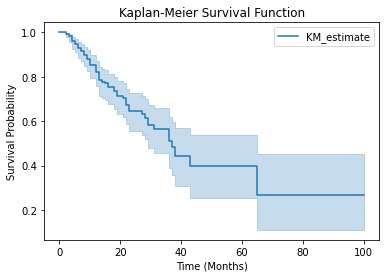

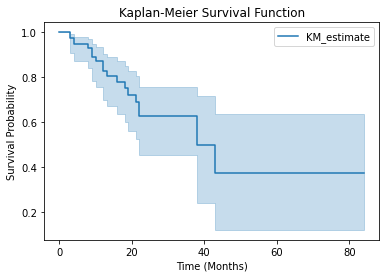

In [120]:
kaplanmeierfitter(members_info, deleted_info,2,10,0.7)
kaplanmeierfittertest(members_info, deleted_info,2,10,0.7)

Correlation coefficient: 0.9965972614628599


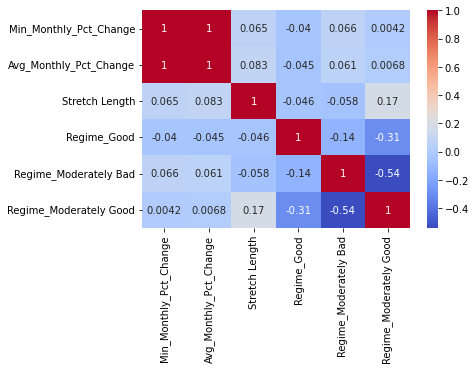

<lifelines.CoxPHFitter: fitted with 720 total observations, 656 right-censored observations>
             duration col = 'Stretch Length'
                event col = 'Deleted'
      baseline estimation = breslow
   number of observations = 720
number of events observed = 64
   partial log-likelihood = -269.39
         time fit was run = 2024-04-04 14:30:21 UTC

---
                         coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                      
Min_Monthly_Pct_Change  -0.84       0.43       0.83            -2.46             0.77                 0.09                 2.17
Avg_Monthly_Pct_Change  -0.08       0.93       0.91            -1.87             1.71                 0.15                 5.54
Regime_Good              0.02       1.02       0.44            -0.85             0.88                 0.43                 2.42
Regime_Moderately Bad   -0.36       0.70       0.38            -1.11             0.39                 0.33                 1.48
Regime_Moderately Good  -1.74       0.18       0.34            -2.41            -1.07                 0.09                 0.34

                         cmp to     z      p   -log2(p)
covariate                                              
Min_Monthly_Pct_Change     0.00 -1.02   0.31       1.71
Avg_Monthly_Pct_Change     0.00 -0.08   0.93       0.10
Regime_Good                0.00  0.04   0.97       0.05
Regime_Moderately Bad      0.00 -0.94   0.35       1.52
Regime_Moderately Good     0.00 -5.06 <0.005      21.20
---
Concordance = 0.76
Partial AIC = 548.78
log-likelihood ratio test = 41.77 on 5 df
-log2(p) of ll-ratio test = 23.86

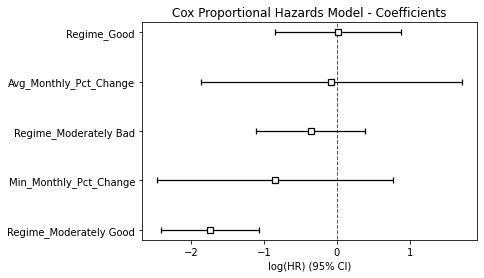

In [143]:
coxphfitter(members_info, deleted_info,2,10,0.7)

Correlation coefficient: 0.9965972614628598


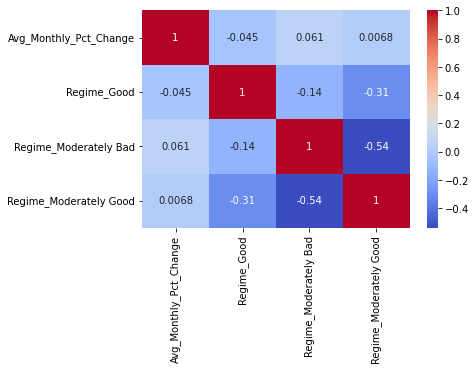

<lifelines.CoxPHFitter: fitted with 720 total observations, 656 right-censored observations>
             duration col = 'Stretch Length'
                event col = 'Deleted'
      baseline estimation = breslow
   number of observations = 720
number of events observed = 64
   partial log-likelihood = -269.82
         time fit was run = 2024-04-02 20:56:16 UTC

---
                         coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                      
Avg_Monthly_Pct_Change  -0.87       0.42       0.55            -1.95             0.20                 0.14                 1.23
Regime_Good             -0.05       0.95       0.44            -0.90             0.80                 0.40                 2.23
Regime_Moderately Bad   -0.42       0.66       0.38            -1.16             0.32                 0.31                 1.38
Regime_Moderately Good  -1.77       0.17       0.34            -2.44            -1.11                 0.09                 0.33

                         cmp to     z      p   -log2(p)
covariate                                              
Avg_Monthly_Pct_Change     0.00 -1.59   0.11       3.16
Regime_Good                0.00 -0.12   0.91       0.14
Regime_Moderately Bad      0.00 -1.11   0.27       1.89
Regime_Moderately Good     0.00 -5.21 <0.005      22.34
---
Concordance = 0.76
Partial AIC = 547.65
log-likelihood ratio test = 40.90 on 4 df
-log2(p) of ll-ratio test = 25.08

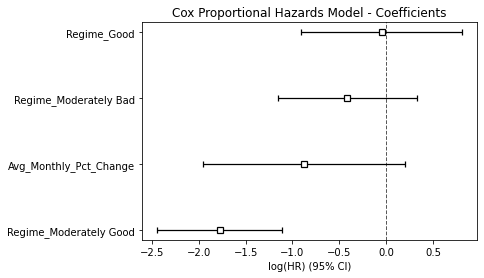

In [137]:
coxphfitter2(members_info, deleted_info,2,10,0.7)

In [313]:
deleted_info[deleted_info['Ticker']]

,Date Removed,Ticker,Reason,Date,SHROUT,PRC,Market Cap,Threshold,Year,Above Threshold,...,Prev Market Cap,Monthly Pct Change,Deleted,ind_x,first_char,first_two_chars,Industry,ind_y,first_char_y,first_two_chars_y
0,2020-06-22,ADS,Market Cap,2015-01-30,64020.0,288.82999,1.849090e+10,5.300000e+09,2015,True,...,NaN,NaN,1,7322,7,73,Information Technology,7322,7,73
1,2020-06-22,ADS,Market Cap,2015-02-27,62805.0,278.51001,1.749182e+10,5.300000e+09,2015,True,...,1.849090e+10,-0.054031,1,7322,7,73,Information Technology,7322,7,73
2,2020-06-22,ADS,Market Cap,2015-03-31,62805.0,296.25000,1.860598e+10,5.300000e+09,2015,True,...,1.749182e+10,0.063696,1,7322,7,73,Information Technology,7322,7,73
3,2020-06-22,ADS,Market Cap,2015-04-30,62234.0,297.31000,1.850279e+10,5.300000e+09,2015,True,...,1.860598e+10,-0.005546,1,7322,7,73,Information Technology,7322,7,73
4,2020-06-22,ADS,Market Cap,2015-05-29,62049.0,298.03000,1.849246e+10,5.300000e+09,2015,True,...,1.850279e+10,-0.000558,1,7322,7,73,Information Technology,7322,7,73
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3658,2021-03-22,XRX,Market Cap,2020-10-30,205957.0,17.38000,3.579533e+09,6.100000e+09,2020,False,...,3.998273e+09,-0.104730,1,3577,3,35,Industrials,3577,3,35
3659,2021-03-22,XRX,Market Cap,2020-11-30,198385.0,21.89000,4.342648e+09,6.100000e+09,2020,False,...,3.579533e+09,0.213188,1,3577,3,35,Industrials,3577,3,35
3660,2021-03-22,XRX,Market Cap,2020-12-31,198385.0,23.19000,4.600548e+09,8.200000e+09,2020,False,...,4.342648e+09,0.059388,1,3577,3,35,Industrials,3577,3,35
3661,2021-03-22,XRX,Market Cap,2021-01-29,198386.0,21.03000,4.172058e+09,8.200000e+09,2021,False,...,4.600548e+09,-0.093139,1,3577,3,35,Industrials,3577,3,35


In [119]:
for regime in regimes:
    for i in range(12):
        for j in range(i):
            for p in np.arange(0,0.25,0.05):
                calibration_deletion_rfs(deleted_info, members_info,j,i,p,regime)

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.048670   
4      ADS           1               -0.219543               -0.068818   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.036180   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.029124   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.048670   
4      ADS           1               -0.219543               -0.068818   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.036180   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.029124   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.048670   
4      ADS           1               -0.219543               -0.068818   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.036180   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.029124   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.048670   
4      ADS           1               -0.219543               -0.068818   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.036180   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.029124   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.048670   
4      ADS           1               -0.219543               -0.068818   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.036180   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.029124   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.048670   
4      ADS           1               -0.219543               -0.068818   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.036180   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.029124   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.048670   
4      ADS           1               -0.219543               -0.068818   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.036180   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.029124   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.048670   
4      ADS           1               -0.219543               -0.068818   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.036180   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.029124   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.048670   
4      ADS           1               -0.219543               -0.068818   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.036180   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.029124   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.048670   
4      ADS           1               -0.219543               -0.068818   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.036180   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.029124   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.024084   
4      ADS           1               -0.219543               -0.072580   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.018633   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.002025   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.024084   
4      ADS           1               -0.219543               -0.072580   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.018633   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.002025   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.024084   
4      ADS           1               -0.219543               -0.072580   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.018633   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.002025   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.024084   
4      ADS           1               -0.219543               -0.072580   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.018633   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.002025   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.024084   
4      ADS           1               -0.219543               -0.072580   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.018633   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.002025   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.048670   
4      ADS           1               -0.219543               -0.068818   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.036180   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.029124   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.048670   
4      ADS           1               -0.219543               -0.068818   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.036180   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.029124   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.048670   
4      ADS           1               -0.219543               -0.068818   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.036180   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.029124   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.048670   
4      ADS           1               -0.219543               -0.068818   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.036180   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.029124   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.048670   
4      ADS           1               -0.219543               -0.068818   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.036180   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.029124   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.024084   
4      ADS           1               -0.219543               -0.072580   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.018633   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.002025   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.024084   
4      ADS           1               -0.219543               -0.072580   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.018633   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.002025   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.024084   
4      ADS           1               -0.219543               -0.072580   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.018633   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.002025   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.024084   
4      ADS           1               -0.219543               -0.072580   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.018633   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.002025   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.024084   
4      ADS           1               -0.219543               -0.072580   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.018633   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.002025   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.007673   
4      ADS           1               -0.219543               -0.085263   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.023903   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.004523   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.007673   
4      ADS           1               -0.219543               -0.085263   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.023903   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.004523   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.007673   
4      ADS           1               -0.219543               -0.085263   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.023903   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.004523   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.007673   
4      ADS           1               -0.219543               -0.085263   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.023903   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.004523   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.007673   
4      ADS           1               -0.219543               -0.085263   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.023903   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.004523   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.189808   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.031525   
4      ADS           1               -0.219543               -0.127967   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.114391   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.074754   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.025049   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.048670   
4      ADS           1               -0.219543               -0.068818   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.036180   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.029124   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.048670   
4      ADS           1               -0.219543               -0.068818   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.036180   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.029124   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.048670   
4      ADS           1               -0.219543               -0.068818   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.036180   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.029124   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.048670   
4      ADS           1               -0.219543               -0.068818   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.036180   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.029124   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.048670   
4      ADS           1               -0.219543               -0.068818   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.036180   
798   ZION           5                0.016114                0.071165   
799   ZION           6                0.015383                0.029124   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.024084   
4      ADS           1               -0.219543               -0.072580   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.018633   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.002025   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.024084   
4      ADS           1               -0.219543               -0.072580   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.018633   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.002025   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.024084   
4      ADS           1               -0.219543               -0.072580   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.018633   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.002025   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.024084   
4      ADS           1               -0.219543               -0.072580   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.018633   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.002025   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.024084   
4      ADS           1               -0.219543               -0.072580   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.018633   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.002025   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.007673   
4      ADS           1               -0.219543               -0.085263   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.023903   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.004523   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.007673   
4      ADS           1               -0.219543               -0.085263   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.023903   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.004523   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.007673   
4      ADS           1               -0.219543               -0.085263   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.023903   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.004523   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.007673   
4      ADS           1               -0.219543               -0.085263   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.023903   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.004523   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.007673   
4      ADS           1               -0.219543               -0.085263   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.023903   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473               -0.004523   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.001552   
4      ADS           1               -0.608174               -0.172415   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.021510   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473                0.014608   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.001552   
4      ADS           1               -0.608174               -0.172415   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.021510   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473                0.014608   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.001552   
4      ADS           1               -0.608174               -0.172415   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.021510   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473                0.014608   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.001552   
4      ADS           1               -0.608174               -0.172415   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.021510   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473                0.014608   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.168448   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.082962               -0.001552   
4      ADS           1               -0.608174               -0.172415   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.031008   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.021510   
798   ZION           5                0.016114                0.071165   
799   ZION           6               -0.095473                0.014608   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1                     0.0                     0.0   
1      AAL           2                     0.0                     0.0   
2      AAL           3                     0.0                     0.0   
3      AAL           4                     0.0                     0.0   
4      ADS           1                     0.0                     0.0   
..     ...         ...                     ...                     ...   
795   ZION           2                     0.0                     0.0   
796   ZION           3                     0.0                     0.0   
797   ZION           4                     0.0                     0.0   
798   ZION           5                     0.0                     0.0   
799   ZION           6                     0.0                     0.0   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_5140/1002648159.py:13: SettingWithCopyWarning: 
A val

    Ticker  Stretch ID  Min_Monthly_Pct_Change  Avg_Monthly_Pct_Change  \
0      AAL           1               -0.364869               -0.364869   
1      AAL           2               -0.149188               -0.149188   
2      AAL           3               -0.082130               -0.082130   
3      AAL           4               -0.078646               -0.078646   
4      ADS           1               -0.219543               -0.219543   
..     ...         ...                     ...                     ...   
795   ZION           2               -0.169231               -0.169231   
796   ZION           3               -0.101037               -0.101037   
797   ZION           4               -0.330820               -0.330820   
798   ZION           5                0.126216                0.126216   
799   ZION           6                0.034714                0.034714   

     Stretch Length    Year  first_two_chars  Last Stretch Length  Deleted  \
0               3.0  2020.0      

KeyboardInterrupt: 

In [184]:
num_months_range = range(1, 38)  # From 1 to 12 months
threshold_months_max = 39  # Example: Assuming you want to start from 6 to 12
prob_threshold_range = np.arange(0.1, 1.1, 0.1)  # Adjusted step to fit your range
regimes = ['Bad', 'Moderately Bad', 'Moderately Good', 'Good']  # Example regimes

In [192]:
results_num_months = []

for num_months in num_months_range:
    for threshold_months in range(num_months,threshold_months_max):
        for prob_threshold in prob_threshold_range:
                metrics = calibration_deletion_rfs(deleted_info, members_info, num_months, threshold_months, prob_threshold)
                if metrics:  # Ensure metrics is not None and is a dictionary
                    results_num_months.append({
                        'num_months': num_months,
                        'threshold_months': threshold_months,
                        'prob_threshold': prob_threshold,
                        **metrics
                    })

/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_17991/398177428.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deleted_info['Regime'] = deleted_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_17991/398177428.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  members_info['Regime'] = members_info['Year'].apply(map_year_to_regime)
/var/folders/h8/2vyhfxxj02l5lygm7xxx7d8h0000gn/T/ipykernel_17991/398177428.py:11: SettingWithCopyWarning: 
A val

NameError: name 'num_months_range' is not defined

In [193]:
results=pd.DataFrame(results_num_months)

In [194]:
results.drop_duplicates(inplace=True)
results.reset_index(inplace=True)
results

,index,num_months,threshold_months,prob_threshold,number_of_high_risk_tickers,percentage_high_risk_deleted,count_missed,percentage_missed,percentage_chosen_from_test_set
0,0,1,1,0.1,0,0.000000,0,0.0,0.000000
1,1,1,1,0.2,0,0.000000,0,0.0,0.000000
2,2,1,1,0.3,0,0.000000,0,0.0,0.000000
3,3,1,1,0.4,0,0.000000,0,0.0,0.000000
4,4,1,1,0.5,0,0.000000,0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...
7395,7395,37,38,0.6,19,94.736842,0,0.0,17.272727
7396,7396,37,38,0.7,19,94.736842,0,0.0,17.272727
7397,7397,37,38,0.8,19,94.736842,0,0.0,17.272727
7398,7398,37,38,0.9,19,94.736842,0,0.0,17.272727


In [195]:
results_correct = results[results['threshold_months']>results['num_months']]

In [388]:
grouped_means = results_correct.groupby('prob_threshold').mean()[['percentage_high_risk_deleted', 'count_missed', 'percentage_missed', 'percentage_chosen_from_test_set']]

In [36]:
one_month_diff = results_correct[results_correct['threshold_months'] == results_correct['num_months'] + 1]

column_means = one_month_diff.groupby('prob_threshold').mean()

specific_column_means = column_means[['number_of_high_risk_tickers','percentage_high_risk_deleted', 'count_missed', 'percentage_missed', 'percentage_chosen_from_test_set']]

NameError: name 'results_correct' is not defined

In [389]:
grouped_means

,percentage_high_risk_deleted,count_missed,percentage_missed,percentage_chosen_from_test_set
prob_threshold,,,,
0.1,75.383032,0.000000,0.000000,16.524772
0.2,78.364144,0.000000,0.000000,15.887446
0.3,82.327111,0.002646,0.132275,15.276575
0.4,85.165981,0.013228,0.529101,14.800385
0.5,88.548063,0.050265,1.232678,14.240019
0.6,90.650889,0.137566,2.319547,13.766234
0.7,92.659809,0.317460,4.109052,13.302068
0.8,93.504060,0.592593,7.071128,12.806638
0.9,94.908307,0.986772,10.595710,12.198172


In [395]:
grouped_means2 = results_correct[(results_correct['prob_threshold']>0.69)&(results_correct['prob_threshold']<0.71)].groupby('num_months').mean()[['percentage_high_risk_deleted', 'count_missed', 'percentage_missed', 'percentage_chosen_from_test_set']]

In [396]:
grouped_means2

,percentage_high_risk_deleted,count_missed,percentage_missed,percentage_chosen_from_test_set
num_months,,,,
1,88.658301,0.486486,8.472288,11.769042
2,89.739859,0.388889,8.013928,11.969697
3,93.231293,0.428571,6.385754,12.103896
4,92.527428,0.264706,3.515406,12.994652
5,93.164574,0.212121,2.431457,13.223140
6,93.284255,0.343750,3.734283,13.352273
7,91.590012,0.258065,3.098998,13.958944
8,92.998575,0.400000,3.349314,13.878788
9,95.046524,0.344828,2.993379,13.918495


In [206]:
def calculate_means(results_correct):
    columns = ['percentage_high_risk_deleted', 'count_missed', 'percentage_missed', 'percentage_chosen_from_test_set']
    
    capped_df = pd.DataFrame(columns=columns)
    for num in range(1, 13):
        
        results_to_include = results_correct[
            (results_correct['threshold_months'] > num + 1) &
            (results_correct['num_months'] == num)
        ]

        
        if not results_to_include.empty:
            means = results_to_include[
                (results_to_include['prob_threshold'] > 0.69) &
                (results_to_include['prob_threshold'] < 0.71)
            ].mean()[['percentage_high_risk_deleted', 'count_missed', 'percentage_missed', 'percentage_chosen_from_test_set']]
        
            
            capped_df.loc[num] = means
        else:
            
            capped_df.loc[num] = [pd.NA] * 4  

    return capped_df

averaged_results_df = calculate_means(results_correct)

In [207]:
averaged_results_df

,percentage_high_risk_deleted,count_missed,percentage_missed,percentage_chosen_from_test_set
1,91.121032,0.416667,7.899549,12.171717
2,92.756112,0.400000,5.084526,12.207792
3,94.830638,0.294118,2.292895,12.673797
4,93.202168,0.212121,1.979132,13.195592
5,94.056355,0.156250,1.078970,13.409091
6,92.983283,0.129032,1.744868,13.900293
7,93.136297,0.033333,0.333333,14.242424
8,93.773946,0.379310,2.663591,14.043887
9,94.810745,0.357143,2.637921,14.155844
10,94.262425,0.222222,1.649150,14.612795


In [398]:
grouped_means3 = results_correct[(results_correct['prob_threshold']>0.69)&(results_correct['prob_threshold']<0.71)].groupby('threshold_months').mean()[['percentage_high_risk_deleted', 'count_missed', 'percentage_missed', 'percentage_chosen_from_test_set']]

In [399]:
grouped_means3

,percentage_high_risk_deleted,count_missed,percentage_missed,percentage_chosen_from_test_set
threshold_months,,,,
2,0.000000,0.000000,0.000000,0.000000
3,0.000000,2.000000,100.000000,0.000000
4,33.333333,3.666667,91.666667,0.303030
5,100.000000,1.000000,25.000000,2.727273
6,100.000000,0.000000,0.000000,3.636364
7,100.000000,0.000000,0.000000,3.636364
8,100.000000,1.000000,20.000000,3.636364
9,100.000000,0.750000,10.714286,5.681818
10,100.000000,0.888889,11.111111,6.464646


In [366]:
results_incorrect = results[results['threshold_months']<results['num_months']]
results_incorrect[results_incorrect['num_months']==6]

,index,regime,num_months,threshold_months,prob_threshold,number_of_high_risk_tickers,percentage_high_risk_deleted,count_missed,percentage_missed,percentage_chosen_from_test_set


In [347]:
results[(results['percentage_high_risk_deleted']>99.99999)&(results['percentage_missed']<0.00001)]['num_months'].value_counts()

3     64
4     60
2     59
5     57
6     54
7     51
10    45
11    41
12    40
9     35
8     32
1     27
Name: num_months, dtype: int64

percentage deleted:
100.0
100.0
84.6938775510204
100.0
98.76543209876543
98.88888888888889
97.52066115702478
percentage missed:
0.0
0.0
2.857142857142857
0.0
2.7777777777777777
2.5
0.0


percentage deleted:
100.0
100.0
84.6938775510204
100.0
98.76543209876543
98.88888888888889
97.52066115702478
percentage missed:
0.0
0.0
2.857142857142857
0.0
2.7777777777777777
2.5
0.0


percentage deleted:
100.0
100.0
100.0
100.0
100.0
100.0
100.0
percentage missed:
0.0
0.0
11.428571428571429
1.7857142857142856
6.944444444444445
7.5
1.8181818181818181


percentage deleted:
100.0
100.0
100.0
100.0
100.0
100.0
100.0
percentage missed:
0.0
0.0
11.428571428571429
1.7857142857142856
6.944444444444445
7.5
1.8181818181818181


In [386]:
r = results_correct[(results_correct['prob_threshold']>0.59)&(results_correct['prob_threshold']<0.61)]
print('percentage deleted:')
print(r[r['threshold_months']==6]['percentage_high_risk_deleted'].mean())
print(r[r['threshold_months']==7]['percentage_high_risk_deleted'].mean())
print(r[r['threshold_months']==8]['percentage_high_risk_deleted'].mean())
print(r[r['threshold_months']==9]['percentage_high_risk_deleted'].mean())
print(r[r['threshold_months']==10]['percentage_high_risk_deleted'].mean())
print(r[r['threshold_months']==11]['percentage_high_risk_deleted'].mean())
print(r[r['threshold_months']==12]['percentage_high_risk_deleted'].mean())
#print(df[df['prob_threshold']==0.7]['percentage_high_risk_deleted'].mean())

print('percentage missed:')
print(r[r['threshold_months']==6]['percentage_missed'].mean())
print(r[r['threshold_months']==7]['percentage_missed'].mean())
print(r[r['threshold_months']==8]['percentage_missed'].mean())
print(r[r['threshold_months']==9]['percentage_missed'].mean())
print(r[r['threshold_months']==10]['percentage_missed'].mean())
print(r[r['threshold_months']==11]['percentage_missed'].mean())
print(r[r['threshold_months']==12]['percentage_missed'].mean())
#print(df[df['prob_threshold']==0.7]['percentage_missed'].mean())

#df[(df['prob_threshold']>0.29)&(df['prob_threshold']<0.31)]

percentage deleted:
100.0
100.0
100.0
100.0
100.0
100.0
100.0
percentage missed:
0.0
0.0
11.428571428571429
1.7857142857142856
6.944444444444445
7.5
1.8181818181818181


percentage deleted:
100.0
100.0
100.0
100.0
100.0
100.0
100.0
percentage missed:
0.0
0.0
20.0
9.523809523809522
11.25
11.363636363636363
14.166666666666666


percentage deleted:
100.0
100.0
100.0
100.0
100.0
100.0
100.0
percentage missed:
0.0
0.0
20.0
9.523809523809522
11.25
11.363636363636363
14.166666666666666


percentage deleted:
100.0
100.0
100.0
100.0
100.0
100.0
100.0
percentage missed:
10.0
0.0
20.0
39.285714285714285
16.666666666666668
16.25
22.727272727272727


percentage deleted:
100.0
100.0
100.0
100.0
100.0
100.0
100.0
percentage missed:
8.333333333333334
0.0
20.0
38.095238095238095
16.25
15.909090909090908
22.5


,regime,num_months,threshold_months,prob_threshold,number_of_high_risk_tickers,percentage_high_risk_deleted,count_missed,percentage_missed,percentage_chosen_from_test_set
0,Bad,1,6,0.2,7,57.142857,0,0.0,6.363636
1,Bad,1,6,0.3,5,80.000000,0,0.0,4.545455
2,Bad,1,6,0.4,4,100.000000,0,0.0,3.636364
3,Bad,1,6,0.5,4,100.000000,0,0.0,3.636364
4,Bad,1,6,0.6,4,100.000000,0,0.0,3.636364
...,...,...,...,...,...,...,...,...,...
1675,Good,12,12,0.2,14,71.428571,0,0.0,12.727273
1676,Good,12,12,0.3,11,90.909091,0,0.0,10.000000
1677,Good,12,12,0.4,10,100.000000,0,0.0,9.090909
1678,Good,12,12,0.5,10,100.000000,0,0.0,9.090909


,regime,num_months,threshold_months,prob_threshold,number_of_high_risk_tickers,percentage_high_risk_deleted,count_missed,percentage_missed,percentage_chosen_from_test_set
0,Bad,1,6,0.2,7,57.142857,0,0.0,6.363636
1,Bad,1,6,0.3,5,80.000000,0,0.0,4.545455
2,Bad,1,6,0.4,4,100.000000,0,0.0,3.636364
3,Bad,1,6,0.5,4,100.000000,0,0.0,3.636364
4,Bad,1,6,0.6,4,100.000000,0,0.0,3.636364
...,...,...,...,...,...,...,...,...,...
1675,Good,12,12,0.2,14,71.428571,0,0.0,12.727273
1676,Good,12,12,0.3,11,90.909091,0,0.0,10.000000
1677,Good,12,12,0.4,10,100.000000,0,0.0,9.090909
1678,Good,12,12,0.5,10,100.000000,0,0.0,9.090909


percentage deleted:
nan
nan
nan
nan
nan
nan
nan
percentage missed:
nan
nan
nan
nan
nan
nan
nan


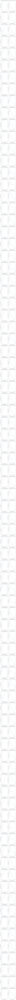

In [236]:
unique_combinations = results[['num_months', 'threshold_months']].drop_duplicates()

num_combinations = len(unique_combinations)

fig, axes = plt.subplots(num_combinations, 2, figsize=(8, 6 * num_combinations), squeeze=False)

for (idx, row), ax in zip(unique_combinations.iterrows(), axes):
    num, thresh = row['num_months'], row['threshold_months']
    
    subset = results[(results['num_months'] == num) & (results['threshold_months'] == thresh)]
    
    
    sns.lineplot(data=subset, x='prob_threshold', y='percentage_high_risk_deleted', ax=ax[0])
    ax[0].set_title(f'Historical Months: {num}, Forecast Window: {thresh}')
    ax[0].set_xlabel('Probability Threshold')
    ax[0].set_ylabel('Percentage High Risk Deleted')
    
   
    sns.lineplot(data=subset, x='prob_threshold', y='percentage_chosen_from_test_set', ax=ax[1])
    ax[1].set_title(f'Historical Months: {num}, Forecast Window: {thresh}')
    ax[1].set_xlabel('Probability Threshold')
    ax[1].set_ylabel('Percent Chosen From Test Set')

plt.tight_layout()
plt.show()

fig.savefig('my_large_figure.png', dpi=100)

';oyoy;2345682`231y22y1o32oy1t2y3oppppypoyyyppyoypyppppypyyppyypyypyypyyppppypyypypyyyyyyypyperytuoioypu### fig.savefig('my_large_figure.png', dpi=100)

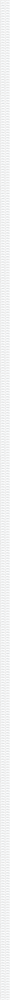

ValueError: Image size of 800x75600 pixels is too large. It must be less than 2^16 in each direction.

In [402]:
unique_combinations = results_correct[['num_months', 'threshold_months']].drop_duplicates()

num_combinations = len(unique_combinations)

fig, axes = plt.subplots(num_combinations, 2, figsize=(8, 2 * num_combinations))

axes = axes.flatten()

for (idx, row), axs in zip(unique_combinations.iterrows(), axes.reshape(-1, 2)):
    num, thresh = row['num_months'], row['threshold_months']
    
    subset = results_correct[(results_correct['num_months'] == num) & (results_correct['threshold_months'] == thresh)]
    
    sns.lineplot(data=subset, x='prob_threshold', y='percentage_high_risk_deleted', ax=axs[0])
    axs[0].set_title(f'Historical Months: {num}, Forecast Window: {thresh}')
    axs[0].set_xlabel('Probability Threshold')
    axs[0].set_ylabel('Percentage High Risk Deleted')

    sns.lineplot(data=subset, x='prob_threshold', y='percentage_missed', ax=axs[1])
    axs[1].set_title(f'Historical Months: {num}, Forecast Window: {thresh}')
    axs[1].set_xlabel('Probability Threshold')
    axs[1].set_ylabel('Percentage Missed')

plt.tight_layout()

plt.show()

fig.savefig('my_large_figure3.png', dpi=100)

In [3]:
# calibration_deletion_boosted(deleted_info, members_info,4,5, 0.10)